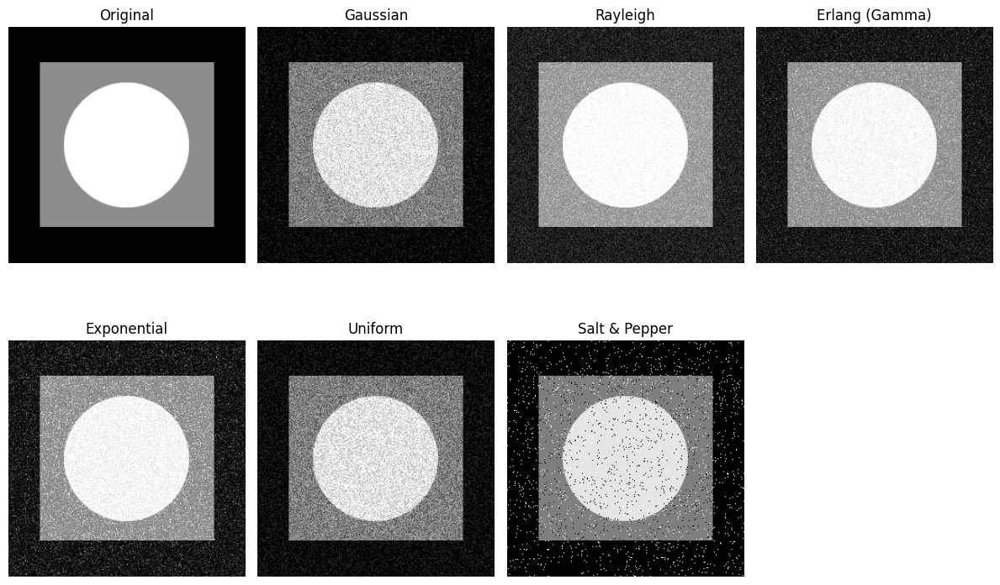

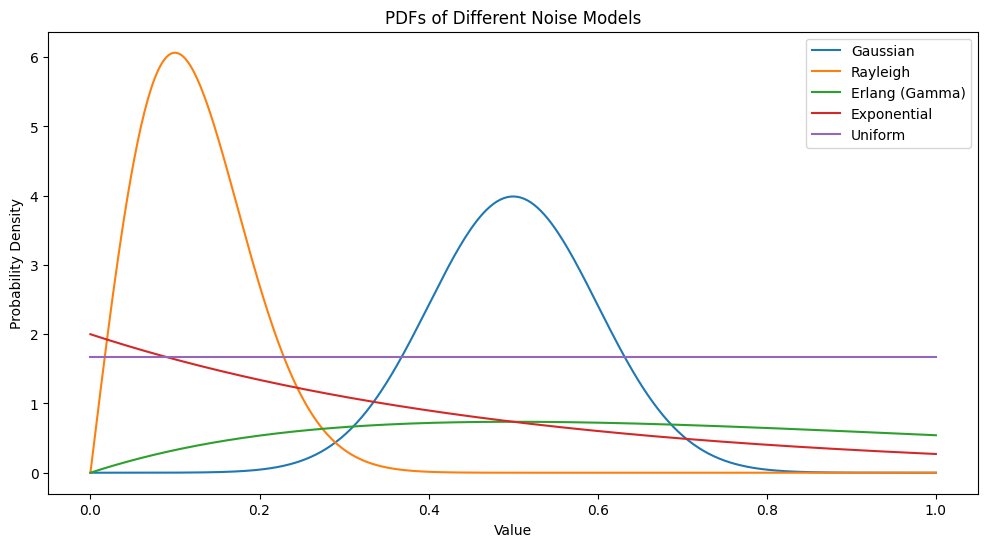

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.util import random_noise
import math

# -------------------------
# Load a sample grayscale image
# -------------------------
img = cv2.imread(cv2.samples.findFile("/content/Fig0503 (original_pattern).tif"), cv2.IMREAD_GRAYSCALE)
if img is None:
    # fallback: create synthetic image if lena not found
    img = np.ones((256,256), dtype=np.uint8)*128
    cv2.putText(img, "TEST", (50,130), cv2.FONT_HERSHEY_SIMPLEX, 2, (0), 5)

# Normalize image for skimage (0–1 range)
img_norm = img / 255.0

# -------------------------
# Generate noisy versions
# -------------------------
noisy_gaussian = random_noise(img_norm, mode='gaussian', mean=0, var=0.01)
noisy_rayleigh = img_norm + np.random.rayleigh(scale=0.1, size=img_norm.shape)
noisy_erlang   = img_norm + np.random.gamma(shape=2, scale=0.05, size=img_norm.shape)
noisy_expo     = img_norm + np.random.exponential(scale=0.1, size=img_norm.shape)
noisy_uniform  = img_norm + np.random.uniform(-0.2, 0.2, size=img_norm.shape)
noisy_saltpep  = random_noise(img_norm, mode='s&p', amount=0.05)

# Clip all images back to [0,1]
noisy_images = [np.clip(n, 0, 1) for n in
                [noisy_gaussian, noisy_rayleigh, noisy_erlang,
                 noisy_expo, noisy_uniform, noisy_saltpep]]

titles = ["Gaussian", "Rayleigh", "Erlang (Gamma)", "Exponential", "Uniform", "Salt & Pepper"]

# -------------------------
# Show original + noisy images
# -------------------------
plt.figure(figsize=(12,8))
plt.subplot(2,4,1)
plt.imshow(img, cmap='gray')
plt.title("Original")
plt.axis("off")

for i, (n_img, t) in enumerate(zip(noisy_images, titles), start=2):
    plt.subplot(2,4,i)
    plt.imshow(n_img, cmap='gray')
    plt.title(t)
    plt.axis("off")

plt.tight_layout()
plt.show()

# -------------------------
# Plot PDFs of each distribution
# -------------------------
x = np.linspace(0,1,500)
pdfs = {
    "Gaussian": (1/np.sqrt(2*np.pi*0.01)) * np.exp(-(x-0.5)**2 / (2*0.01)),
    "Rayleigh": (x/0.1**2) * np.exp(-x**2/(2*0.1**2)),
    "Erlang (Gamma)": (x**(2-1) * np.exp(-x/0.5)) / (0.5**2 * math.factorial(2-1)),
    "Exponential": (1/0.5) * np.exp(-x/0.5),
    "Uniform": np.ones_like(x) * 1/(0.8-0.2),
    "Salt & Pepper": None
}

plt.figure(figsize=(12,6))
for name, pdf in pdfs.items():
    if pdf is not None:
        plt.plot(x, pdf, label=name)
plt.title("PDFs of Different Noise Models")
plt.xlabel("Value")
plt.ylabel("Probability Density")
plt.legend()
plt.show()

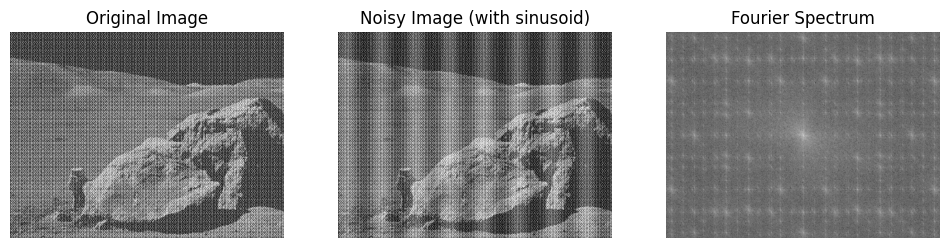

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# ---- 1. Upload and read image ----
from tkinter import Tk, filedialog


# Read in grayscale
img = cv2.imread('/content/Fig0516(a)(applo17_boulder_noisy).tif', cv2.IMREAD_GRAYSCALE)

# ---- 2. Add synthetic sinusoidal noise to simulate Fig. 5.5 ----
rows, cols = img.shape
x = np.arange(cols)
y = np.arange(rows)
X, Y = np.meshgrid(x, y)

# Define sinusoidal noise parameters
freq_x = 8    # frequency in x-direction
freq_y = 0    # frequency in y-direction
amplitude = 40

# Create sinusoidal noise
sinusoidal_noise = amplitude * np.sin(2 * np.pi * (freq_x * X / cols + freq_y * Y / rows))

# Corrupted image
noisy_img = img + sinusoidal_noise
noisy_img = np.clip(noisy_img, 0, 255).astype(np.uint8)

# ---- 3. Fourier Spectrum ----
# Compute FFT
f = np.fft.fft2(noisy_img)
fshift = np.fft.fftshift(f)   # Shift zero freq to center
magnitude_spectrum = 20 * np.log(np.abs(fshift) + 1)

# ---- 4. Plot Results ----
plt.figure(figsize=(12,6))

plt.subplot(1,3,1)
plt.title("Original Image")
plt.imshow(img, cmap='gray')
plt.axis("off")

plt.subplot(1,3,2)
plt.title("Noisy Image (with sinusoid)")
plt.imshow(noisy_img, cmap='gray')
plt.axis("off")

plt.subplot(1,3,3)
plt.title("Fourier Spectrum")
plt.imshow(magnitude_spectrum, cmap='gray')
plt.axis("off")

plt.show()


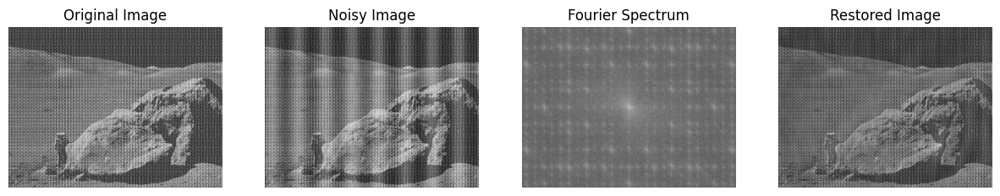

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from tkinter import Tk, filedialog

# ---- 1. Upload and read image ----

img = cv2.imread('/content/Fig0516(a)(applo17_boulder_noisy).tif', cv2.IMREAD_GRAYSCALE)

# ---- 2. Add synthetic sinusoidal noise ----
rows, cols = img.shape
x = np.arange(cols)
y = np.arange(rows)
X, Y = np.meshgrid(x, y)

freq_x = 8    # horizontal frequency
freq_y = 0
amplitude = 40

sinusoidal_noise = amplitude * np.sin(2 * np.pi * (freq_x * X / cols + freq_y * Y / rows))
noisy_img = img + sinusoidal_noise
noisy_img = np.clip(noisy_img, 0, 255).astype(np.uint8)

# ---- 3. Fourier Spectrum ----
f = np.fft.fft2(noisy_img)
fshift = np.fft.fftshift(f)
magnitude_spectrum = 20 * np.log(np.abs(fshift) + 1)

# ---- 4. Create a mask to remove spikes ----
# Start with all ones (keep all frequencies)
mask = np.ones((rows, cols), np.uint8)

# Define radius to suppress impulses
r = 5   # size of "notch"
crow, ccol = rows//2, cols//2   # center

# Remove symmetric impulses (approximate location known from freq_x)
mask[crow, ccol+freq_x] = 0
mask[crow, ccol-freq_x] = 0

# Make them a bit larger (small circle around spikes)
cv2.circle(mask, (ccol+freq_x, crow), r, 0, -1)
cv2.circle(mask, (ccol-freq_x, crow), r, 0, -1)

# Apply mask
fshift_filtered = fshift * mask

# ---- 5. Inverse FFT to reconstruct image ----
f_ishift = np.fft.ifftshift(fshift_filtered)
img_restored = np.fft.ifft2(f_ishift)
img_restored = np.abs(img_restored)

# ---- 6. Plot Results ----
plt.figure(figsize=(15,6))

plt.subplot(1,4,1)
plt.title("Original Image")
plt.imshow(img, cmap='gray')
plt.axis("off")

plt.subplot(1,4,2)
plt.title("Noisy Image")
plt.imshow(noisy_img, cmap='gray')
plt.axis("off")

plt.subplot(1,4,3)
plt.title("Fourier Spectrum")
plt.imshow(magnitude_spectrum, cmap='gray')
plt.axis("off")

plt.subplot(1,4,4)
plt.title("Restored Image")
plt.imshow(img_restored, cmap='gray')
plt.axis("off")

plt.show()


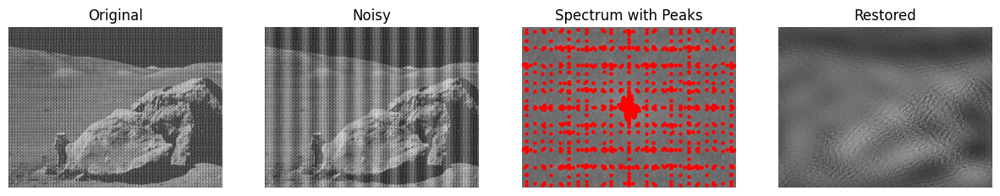

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from tkinter import Tk, filedialog

# ---- 1. Upload and read image ----
img = cv2.imread('/content/Fig0516(a)(applo17_boulder_noisy).tif', cv2.IMREAD_GRAYSCALE)

# ---- 2. Add synthetic sinusoidal noise (for demo) ----
rows, cols = img.shape
x = np.arange(cols)
y = np.arange(rows)
X, Y = np.meshgrid(x, y)

freq_x = 12   # try different values
amplitude = 40
sinusoidal_noise = amplitude * np.sin(2*np.pi*freq_x*X/cols)
noisy_img = img + sinusoidal_noise
noisy_img = np.clip(noisy_img, 0, 255).astype(np.uint8)

# ---- 3. Fourier Spectrum ----
f = np.fft.fft2(noisy_img)
fshift = np.fft.fftshift(f)
magnitude_spectrum = 20*np.log(np.abs(fshift) + 1)

# ---- 4. Automatic peak detection ----
# Normalize for easier thresholding
norm_spectrum = (magnitude_spectrum - magnitude_spectrum.min()) / (magnitude_spectrum.max() - magnitude_spectrum.min())

# Threshold: find bright spots (ignore center DC component)
threshold = 0.6   # adjust if needed
peaks = np.where(norm_spectrum > threshold)

# ---- 5. Create mask to remove spikes ----
mask = np.ones_like(fshift, dtype=np.uint8)
crow, ccol = rows//2, cols//2

for (y, x) in zip(peaks[0], peaks[1]):
    # ignore the central DC peak
    if abs(y-crow) < 10 and abs(x-ccol) < 10:
        continue
    # draw a small black circle around each peak
    cv2.circle(mask, (x, y), 5, 0, -1)

# Apply mask
fshift_filtered = fshift * mask

# ---- 6. Inverse FFT to reconstruct image ----
f_ishift = np.fft.ifftshift(fshift_filtered)
img_restored = np.fft.ifft2(f_ishift)
img_restored = np.abs(img_restored)

# ---- 7. Plot Results ----
plt.figure(figsize=(15,6))

plt.subplot(1,4,1)
plt.title("Original")
plt.imshow(img, cmap='gray')
plt.axis("off")

plt.subplot(1,4,2)
plt.title("Noisy")
plt.imshow(noisy_img, cmap='gray')
plt.axis("off")

plt.subplot(1,4,3)
plt.title("Spectrum with Peaks")
plt.imshow(magnitude_spectrum, cmap='gray')
plt.scatter(peaks[1], peaks[0], c='red', s=5)  # mark peaks
plt.axis("off")

plt.subplot(1,4,4)
plt.title("Restored")
plt.imshow(img_restored, cmap='gray')
plt.axis("off")

plt.show()


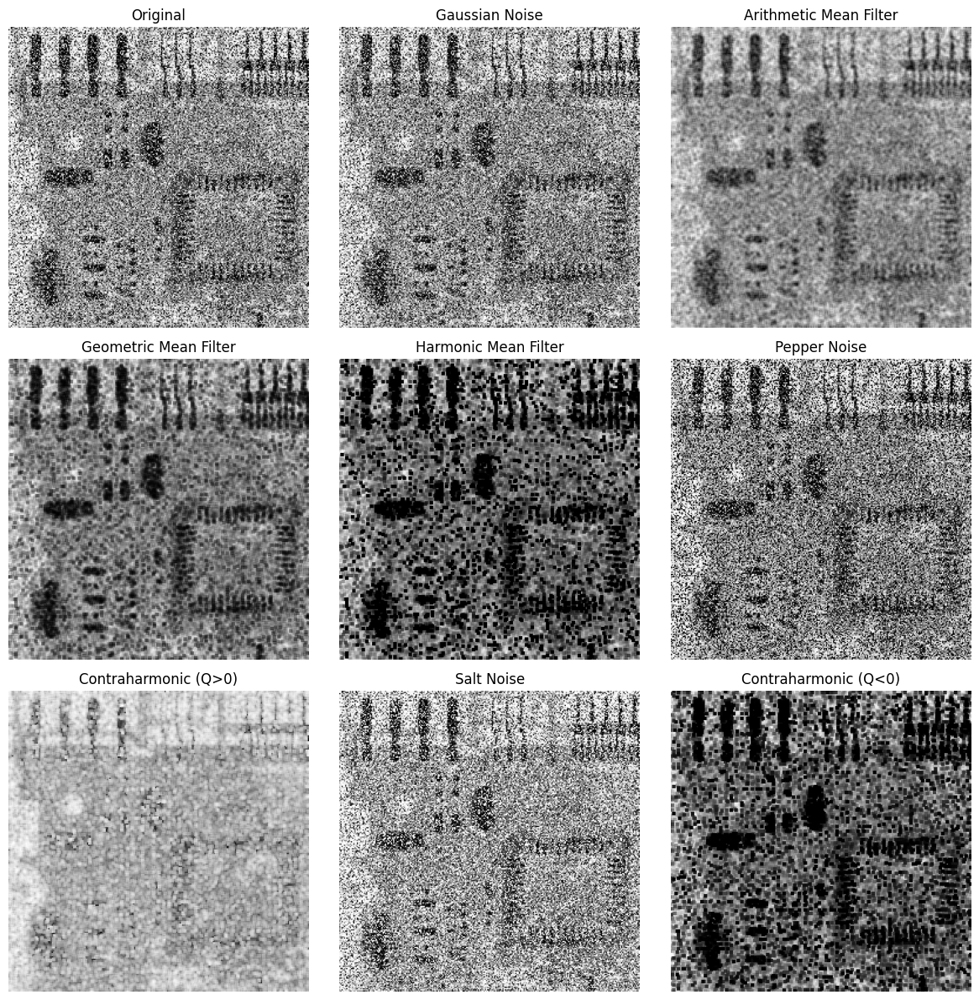

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.util import random_noise

# --------------------------
# Helper functions for filters
# --------------------------

# Arithmetic mean filter
def arithmetic_mean_filter(img, ksize=3):
    kernel = np.ones((ksize, ksize), np.float32) / (ksize * ksize)
    return cv2.filter2D(img, -1, kernel)

# Geometric mean filter
def geometric_mean_filter(img, ksize=3):
    img = img.astype(np.float32) + 1  # add 1 to avoid log(0)
    log_img = np.log(img)
    kernel = np.ones((ksize, ksize), np.float32) / (ksize * ksize)
    geo_mean = cv2.filter2D(log_img, -1, kernel)
    return np.exp(geo_mean) - 1  # subtract 1 back

# Harmonic mean filter
def harmonic_mean_filter(img, ksize=3):
    img = img.astype(np.float32) + 1e-8  # avoid division by zero
    inv_img = 1.0 / img
    kernel = np.ones((ksize, ksize), np.float32)
    sum_inv = cv2.filter2D(inv_img, -1, kernel)
    return (ksize * ksize) / sum_inv

# Contraharmonic mean filter
def contraharmonic_mean_filter(img, ksize=3, Q=1.5):
    img = img.astype(np.float32) + 1e-8  # avoid zero
    num = cv2.filter2D(np.power(img, Q + 1), -1, np.ones((ksize, ksize)))
    den = cv2.filter2D(np.power(img, Q), -1, np.ones((ksize, ksize)))
    return num / (den + 1e-8)

# --------------------------
# MAIN DEMO
# --------------------------
# Load image (grayscale)
img = cv2.imread("/content/Fig0514(a)(ckt_saltpep_prob_pt25).tif", cv2.IMREAD_GRAYSCALE)  # Replace with your X-ray image
img = cv2.resize(img, (256, 256))

# Case 1: Gaussian noise
gaussian_noisy = random_noise(img, mode='gaussian', mean=0, var=400/255**2)  # variance scaled
gaussian_noisy = (gaussian_noisy * 255).astype(np.uint8)

# Case 2: Salt & Pepper noise
pepper_noisy = random_noise(img, mode='pepper', amount=0.1)
pepper_noisy = (pepper_noisy * 255).astype(np.uint8)

salt_noisy = random_noise(img, mode='salt', amount=0.1)
salt_noisy = (salt_noisy * 255).astype(np.uint8)

# Apply filters
arith_filtered = arithmetic_mean_filter(gaussian_noisy, 3)
geo_filtered = geometric_mean_filter(gaussian_noisy, 3)
harmonic_filtered = harmonic_mean_filter(gaussian_noisy, 3)
contra_pepper = contraharmonic_mean_filter(pepper_noisy, 3, Q=1.5)   # for pepper noise
contra_salt = contraharmonic_mean_filter(salt_noisy, 3, Q=-1.5)      # for salt noise

# --------------------------
# Plot Results
# --------------------------
fig, axs = plt.subplots(3, 3, figsize=(12, 12))
axs = axs.ravel()

axs[0].imshow(img, cmap='gray'); axs[0].set_title("Original")
axs[1].imshow(gaussian_noisy, cmap='gray'); axs[1].set_title("Gaussian Noise")
axs[2].imshow(arith_filtered, cmap='gray'); axs[2].set_title("Arithmetic Mean Filter")
axs[3].imshow(geo_filtered, cmap='gray'); axs[3].set_title("Geometric Mean Filter")
axs[4].imshow(harmonic_filtered, cmap='gray'); axs[4].set_title("Harmonic Mean Filter")
axs[5].imshow(pepper_noisy, cmap='gray'); axs[5].set_title("Pepper Noise")
axs[6].imshow(contra_pepper, cmap='gray'); axs[6].set_title("Contraharmonic (Q>0)")
axs[7].imshow(salt_noisy, cmap='gray'); axs[7].set_title("Salt Noise")
axs[8].imshow(contra_salt, cmap='gray'); axs[8].set_title("Contraharmonic (Q<0)")

for ax in axs:
    ax.axis("off")

plt.tight_layout()
plt.show()


/tmp/ipython-input-2767465283.py:53: RuntimeWarning: divide by zero encountered in power
  num = np.sum(values**(Q+1))
/tmp/ipython-input-2767465283.py:54: RuntimeWarning: divide by zero encountered in power
  den = np.sum(values**Q) + 1e-5
/tmp/ipython-input-2767465283.py:55: RuntimeWarning: invalid value encountered in scalar divide
  return num / den


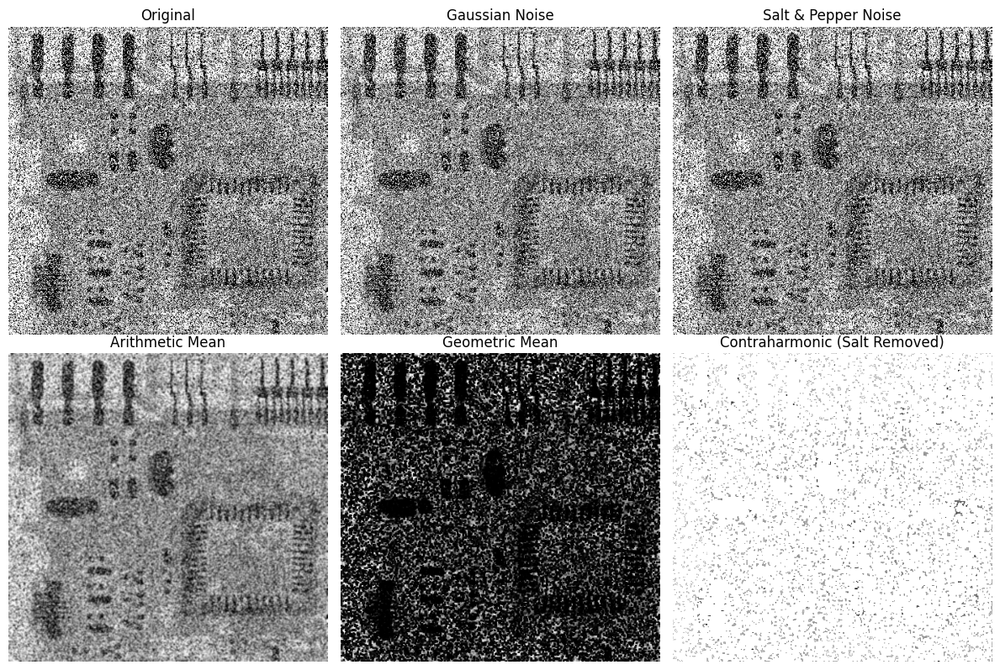

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import generic_filter

# -----------------------------
# Load grayscale image
# -----------------------------
img = cv2.imread(cv2.samples.findFile("/content/Fig0514(a)(ckt_saltpep_prob_pt25).tif"), cv2.IMREAD_GRAYSCALE)
if img is None:
    # fallback: generate synthetic image if lena not available
    img = np.zeros((256,256), dtype=np.uint8)
    cv2.putText(img, "TEST IMAGE", (30,130), cv2.FONT_HERSHEY_SIMPLEX, 1, 255, 2)

# -----------------------------
# Add Noise
# -----------------------------
# Gaussian noise
gauss = img + np.random.normal(0, 20, img.shape)
gauss = np.clip(gauss, 0, 255).astype(np.uint8)

# Salt & pepper noise
def add_salt_pepper(img, prob=0.05):
    noisy = img.copy()
    rnd = np.random.rand(*img.shape)
    noisy[rnd < prob/2] = 0       # pepper
    noisy[rnd > 1 - prob/2] = 255 # salt
    return noisy

sp_noisy = add_salt_pepper(img, prob=0.05)

# -----------------------------
# Arithmetic Mean Filter
# -----------------------------
def arithmetic_mean_filter(image, size=3):
    kernel = np.ones((size,size)) / (size*size)
    return cv2.filter2D(image, -1, kernel)

# -----------------------------
# Geometric Mean Filter
# -----------------------------
def geometric_mean_filter(image, size=3):
    def gmean(values):
        values = values.astype(np.float32) + 1e-5 # avoid log(0)
        return np.exp(np.mean(np.log(values)))
    return generic_filter(image, gmean, size=(size,size))

# -----------------------------
# Contraharmonic Mean Filter
# -----------------------------
def contraharmonic_mean_filter(image, size=3, Q=1.5):
    def chmean(values):
        num = np.sum(values**(Q+1))
        den = np.sum(values**Q) + 1e-5
        return num / den
    return generic_filter(image.astype(np.float32), chmean, size=(size,size))

# -----------------------------
# Apply Filters
# -----------------------------
arith_gauss = arithmetic_mean_filter(gauss, 3)
geo_gauss   = geometric_mean_filter(gauss, 3)

# For salt-and-pepper noise, apply contraharmonic filter
contra_salt = contraharmonic_mean_filter(sp_noisy, 3, Q=-1.5)  # remove salt
contra_pepp = contraharmonic_mean_filter(sp_noisy, 3, Q= 1.5)  # remove pepper

# -----------------------------
# Show Results
# -----------------------------
plt.figure(figsize=(12,8))

plt.subplot(2,3,1); plt.imshow(img, cmap='gray'); plt.title("Original"); plt.axis("off")
plt.subplot(2,3,2); plt.imshow(gauss, cmap='gray'); plt.title("Gaussian Noise"); plt.axis("off")
plt.subplot(2,3,3); plt.imshow(sp_noisy, cmap='gray'); plt.title("Salt & Pepper Noise"); plt.axis("off")

plt.subplot(2,3,4); plt.imshow(arith_gauss, cmap='gray'); plt.title("Arithmetic Mean"); plt.axis("off")
plt.subplot(2,3,5); plt.imshow(geo_gauss, cmap='gray'); plt.title("Geometric Mean"); plt.axis("off")
plt.subplot(2,3,6); plt.imshow(contra_salt, cmap='gray'); plt.title("Contraharmonic (Salt Removed)"); plt.axis("off")

plt.tight_layout()
plt.show()


/usr/local/lib/python3.12/dist-packages/numpy/_core/_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
/tmp/ipython-input-1578053578.py:35: RuntimeWarning: divide by zero encountered in power
  num = np.power(region, Q+1).sum()
/tmp/ipython-input-1578053578.py:36: RuntimeWarning: divide by zero encountered in power
  den = np.power(region, Q).sum() + 1e-8  # avoid division by 0
/tmp/ipython-input-1578053578.py:37: RuntimeWarning: invalid value encountered in scalar divide
  output[i, j] = num / den
/tmp/ipython-input-1578053578.py:39: RuntimeWarning: invalid value encountered in cast
  return np.clip(output, 0, 255).astype(np.uint8)


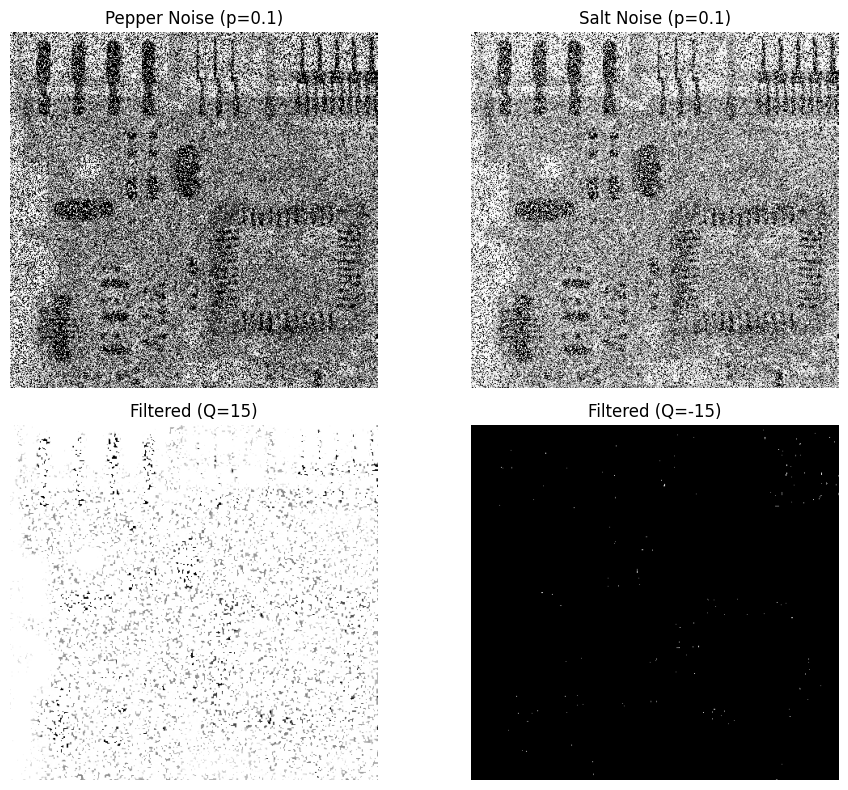

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.util import random_noise

# ------------------------
# 1. Load a grayscale image
# ------------------------
img = cv2.imread("/content/Fig0514(a)(ckt_saltpep_prob_pt25).tif", cv2.IMREAD_GRAYSCALE)

# ------------------------
# 2. Add Pepper Noise (0.1 probability)
# ------------------------
pepper_noise = random_noise(img, mode='pepper', amount=0.1)
pepper_noise = (255 * pepper_noise).astype(np.uint8)

# ------------------------
# 3. Add Salt Noise (0.1 probability)
# ------------------------
salt_noise = random_noise(img, mode='salt', amount=0.1)
salt_noise = (255 * salt_noise).astype(np.uint8)

# ------------------------
# 4. Contraharmonic Mean Filter
# ------------------------
def contraharmonic_mean_filter(image, size=3, Q=1.5):
    pad = size // 2
    padded = cv2.copyMakeBorder(image, pad, pad, pad, pad, cv2.BORDER_REFLECT)
    output = np.zeros_like(image, dtype=np.float32)

    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            region = padded[i:i+size, j:j+size].astype(np.float32)

            num = np.power(region, Q+1).sum()
            den = np.power(region, Q).sum() + 1e-8  # avoid division by 0
            output[i, j] = num / den

    return np.clip(output, 0, 255).astype(np.uint8)

# ------------------------
# 5. Apply filter
# ------------------------
pepper_filtered = contraharmonic_mean_filter(pepper_noise, size=3, Q=15)   # for pepper noise
salt_filtered   = contraharmonic_mean_filter(salt_noise, size=3, Q=-15)    # for salt noise

# ------------------------
# 6. Show Results
# ------------------------
fig, ax = plt.subplots(2, 2, figsize=(10, 8))
ax[0,0].imshow(pepper_noise, cmap='gray'); ax[0,0].set_title("Pepper Noise (p=0.1)")
ax[0,1].imshow(salt_noise, cmap='gray');   ax[0,1].set_title("Salt Noise (p=0.1)")
ax[1,0].imshow(pepper_filtered, cmap='gray'); ax[1,0].set_title("Filtered (Q=15)")
ax[1,1].imshow(salt_filtered, cmap='gray');   ax[1,1].set_title("Filtered (Q=-15)")
for a in ax.ravel(): a.axis("off")
plt.tight_layout()
plt.show()


/tmp/ipython-input-804416393.py:33: RuntimeWarning: divide by zero encountered in power
  num = np.sum(region ** (Q + 1))
/tmp/ipython-input-804416393.py:34: RuntimeWarning: divide by zero encountered in power
  den = np.sum(region ** Q)
/tmp/ipython-input-804416393.py:36: RuntimeWarning: invalid value encountered in scalar divide
  filtered[i, j] = num / den
/tmp/ipython-input-804416393.py:40: RuntimeWarning: invalid value encountered in cast
  return np.clip(filtered, 0, 255).astype(np.uint8)
/usr/local/lib/python3.12/dist-packages/numpy/_core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


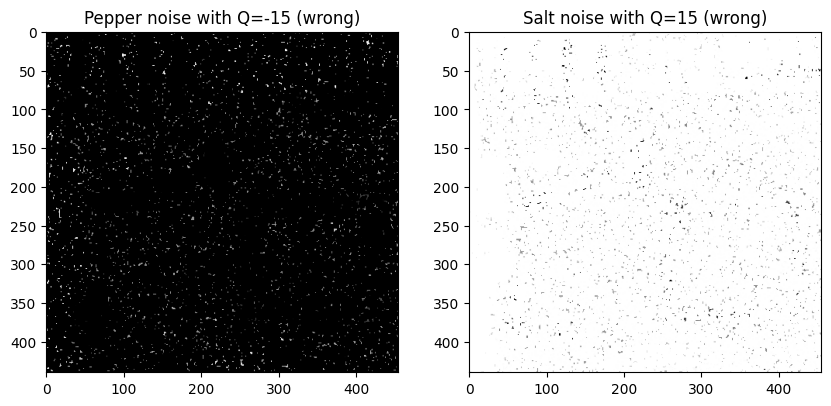

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Function to add salt or pepper noise
def add_noise(img, noise_type="salt", prob=0.1):
    noisy = img.copy()
    h, w = img.shape
    num_pixels = int(prob * h * w)

    # Generate random row and column indices
    row_indices = np.random.randint(0, h, num_pixels)
    col_indices = np.random.randint(0, w, num_pixels)

    if noise_type == "salt":
        # random white pixels
        noisy[row_indices, col_indices] = 255
    elif noise_type == "pepper":
        # random black pixels
        noisy[row_indices, col_indices] = 0

    return noisy

# Contraharmonic mean filter
def contraharmonic_mean_filter(img, size=3, Q=1.5):
    pad = size // 2
    padded = np.pad(img, pad, mode='constant', constant_values=0)
    filtered = np.zeros_like(img, dtype=np.float32)

    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            region = padded[i:i+size, j:j+size].astype(np.float32)
            num = np.sum(region ** (Q + 1))
            den = np.sum(region ** Q)
            if den != 0:
                filtered[i, j] = num / den
            else:
                filtered[i, j] = img[i, j] # Keep original pixel if denominator is zero

    return np.clip(filtered, 0, 255).astype(np.uint8)

# Load grayscale image
img = cv2.imread("/content/Fig0514(a)(ckt_saltpep_prob_pt25).tif", cv2.IMREAD_GRAYSCALE)

# Add pepper and salt noise separately
pepper_img = add_noise(img, "pepper", prob=0.1)
salt_img   = add_noise(img, "salt", prob=0.1)

# Apply contraharmonic filter with WRONG Q values
wrong_pepper = contraharmonic_mean_filter(pepper_img, size=3, Q=-15)  # Wrong sign
wrong_salt   = contraharmonic_mean_filter(salt_img, size=3, Q=15)     # Wrong sign

# Show results
plt.figure(figsize=(10,6))

plt.subplot(1,2,1)
plt.title("Pepper noise with Q=-15 (wrong)")
plt.imshow(wrong_pepper, cmap="gray")

plt.subplot(1,2,2)
plt.title("Salt noise with Q=15 (wrong)")
plt.imshow(wrong_salt, cmap="gray")

plt.show()

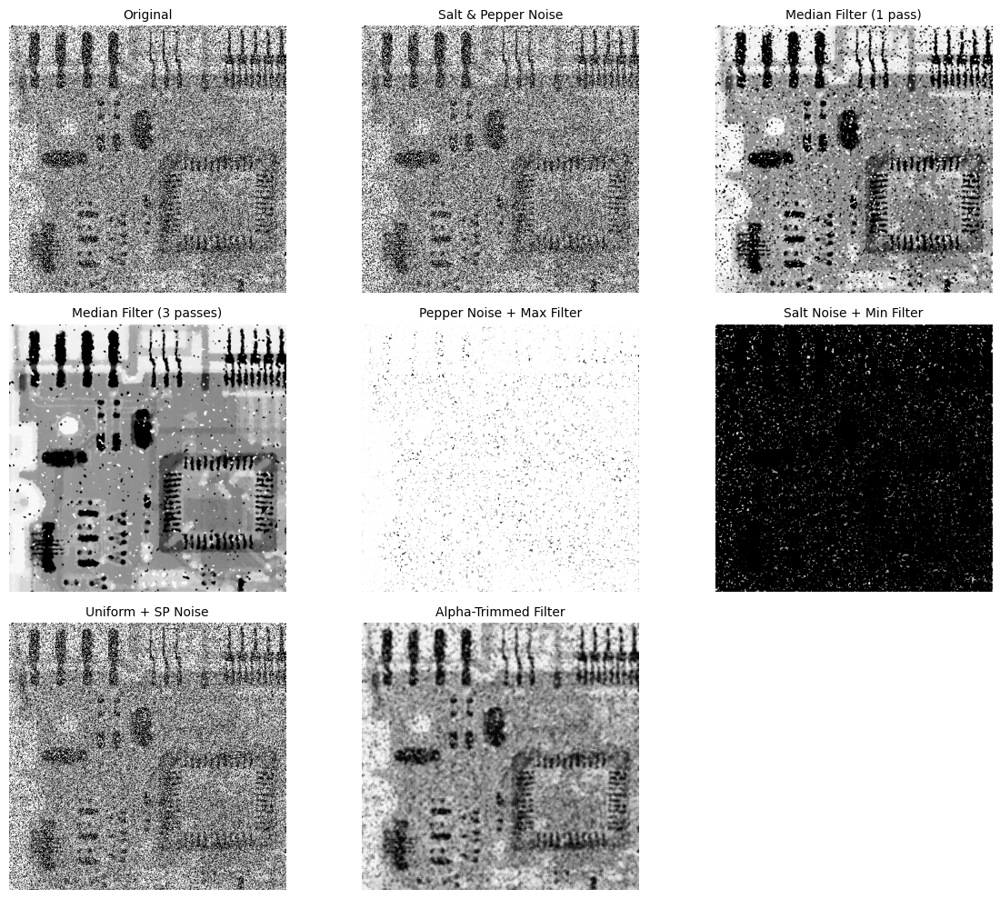

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import median_filter, maximum_filter, minimum_filter

# --- Helper functions ---
def salt_pepper_noise(image, prob):
    noisy = image.copy()
    rnd = np.random.rand(*image.shape)
    noisy[rnd < prob/2] = 0       # pepper
    noisy[rnd > 1 - prob/2] = 255 # salt
    return noisy

def uniform_noise(image, variance=800):
    noise = np.random.uniform(-np.sqrt(variance), np.sqrt(variance), image.shape)
    noisy = image + noise
    return np.clip(noisy, 0, 255).astype(np.uint8)

def alpha_trimmed_filter(image, d, size=5):
    m, n = size, size
    pad = size // 2
    padded = cv2.copyMakeBorder(image, pad, pad, pad, pad, cv2.BORDER_REFLECT)
    output = np.zeros_like(image)

    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            window = padded[i:i+m, j:j+n].flatten()
            window.sort()
            trimmed = window[d: -d]
            output[i, j] = np.mean(trimmed)
    return output.astype(np.uint8)

# --- Load grayscale image ---
img = cv2.imread("/content/Fig0514(a)(ckt_saltpep_prob_pt25).tif", cv2.IMREAD_GRAYSCALE)

# Add salt & pepper noise
sp_noisy = salt_pepper_noise(img, prob=0.1)

# Median filtering (3 passes)
median1 = median_filter(sp_noisy, size=3)
median3 = median_filter(median_filter(median1, size=3), size=3)

# Max filter (for pepper noise)
pepper_noisy = salt_pepper_noise(img, prob=0.1)
max_filtered = maximum_filter(pepper_noisy, size=3)

# Min filter (for salt noise)
salt_noisy = salt_pepper_noise(img, prob=0.1)
min_filtered = minimum_filter(salt_noisy, size=3)

# Alpha-trimmed mean filter (with uniform + SP noise)
uniform_noisy = uniform_noise(img, variance=800)
uniform_sp_noisy = salt_pepper_noise(uniform_noisy, prob=0.1)
alpha_trimmed = alpha_trimmed_filter(uniform_sp_noisy, d=6, size=5)

# --- Show results with Matplotlib ---
titles = [
    "Original", "Salt & Pepper Noise",
    "Median Filter (1 pass)", "Median Filter (3 passes)",
    "Pepper Noise + Max Filter", "Salt Noise + Min Filter",
    "Uniform + SP Noise", "Alpha-Trimmed Filter"
]
images = [
    img, sp_noisy,
    median1, median3,
    max_filtered, min_filtered,
    uniform_sp_noisy, alpha_trimmed
]

plt.figure(figsize=(12, 10))
for i in range(len(images)):
    plt.subplot(3, 3, i+1)
    plt.imshow(images[i], cmap='gray')
    plt.title(titles[i], fontsize=10)
    plt.axis("off")

plt.tight_layout()
plt.show()
